<a href="https://colab.research.google.com/github/pascal-maker/brain-tumor/blob/master/sam2ipynb.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import os
# if using Apple MPS, fall back to CPU for unsupported ops
os.environ["PYTORCH_ENABLE_MPS_FALLBACK"] = "1"
import numpy as np
import torch
import matplotlib.pyplot as plt
from PIL import Image

In [2]:
# select the device for computation
if torch.cuda.is_available():
    device = torch.device("cuda")
elif torch.backends.mps.is_available():
    device = torch.device("mps")
else:
    device = torch.device("cpu")
print(f"using device: {device}")

if device.type == "cuda":
    # use bfloat16 for the entire notebook
    torch.autocast("cuda", dtype=torch.bfloat16).__enter__()
    # turn on tfloat32 for Ampere GPUs (https://pytorch.org/docs/stable/notes/cuda.html#tensorfloat-32-tf32-on-ampere-devices)
    if torch.cuda.get_device_properties(0).major >= 8:
        torch.backends.cuda.matmul.allow_tf32 = True
        torch.backends.cudnn.allow_tf32 = True
elif device.type == "mps":
    print(
        "\nSupport for MPS devices is preliminary. SAM 2 is trained with CUDA and might "
        "give numerically different outputs and sometimes degraded performance on MPS. "
        "See e.g. https://github.com/pytorch/pytorch/issues/84936 for a discussion."
    )

using device: cuda


In [ ]:
np.random.seed(3)

def show_anns(anns, borders=True):
    if len(anns) == 0:
        return
    sorted_anns = sorted(anns, key=(lambda x: x['area']), reverse=True)
    ax = plt.gca()
    ax.set_autoscale_on(False)

    img = np.ones((sorted_anns[0]['segmentation'].shape[0], sorted_anns[0]['segmentation'].shape[1], 4))
    img[:, :, 3] = 0
    for ann in sorted_anns:
        m = ann['segmentation']
        color_mask = np.concatenate([np.random.random(3), [0.5]])
        img[m] = color_mask
        if borders:
            import cv2
            contours, _ = cv2.findContours(m.astype(np.uint8), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)
            # Try to smooth contours
            contours = [cv2.approxPolyDP(contour, epsilon=0.01, closed=True) for contour in contours]
            cv2.drawContours(img, contours, -1, (0, 0, 1, 0.4), thickness=1)

    ax.imshow(img)

In [ ]:
image = Image.open('/content/Y10.jpg')
image = np.array(image.convert("RGB"))

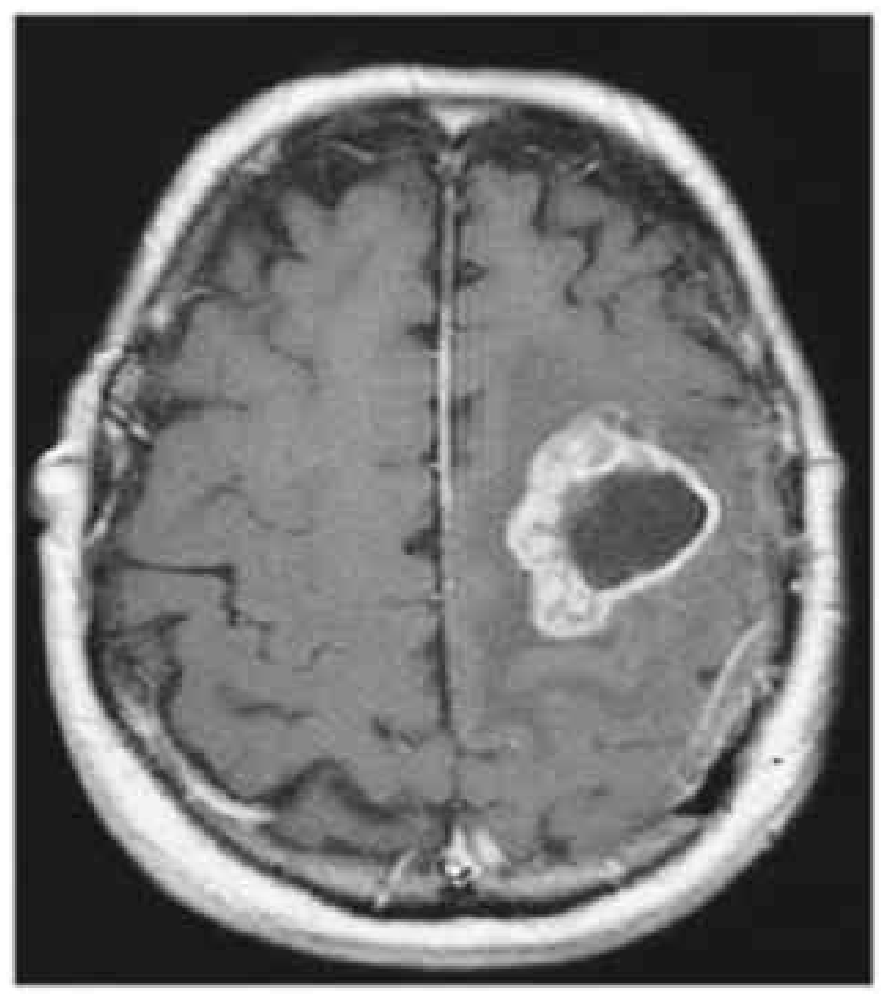

In [ ]:
plt.figure(figsize=(20, 20))
plt.imshow(image)
plt.axis('off')
plt.show()

In [ ]:
from sam2.build_sam import build_sam2
from sam2.automatic_mask_generator import SAM2AutomaticMaskGenerator

sam2_checkpoint = "/content/segment-anything-2/checkpoints/sam2_hiera_large.pt"
model_cfg = "sam2_hiera_l.yaml"

sam2 = build_sam2(model_cfg, sam2_checkpoint, device=device, apply_postprocessing=False)

mask_generator = SAM2AutomaticMaskGenerator(sam2)

In [ ]:
masks = mask_generator.generate(image)

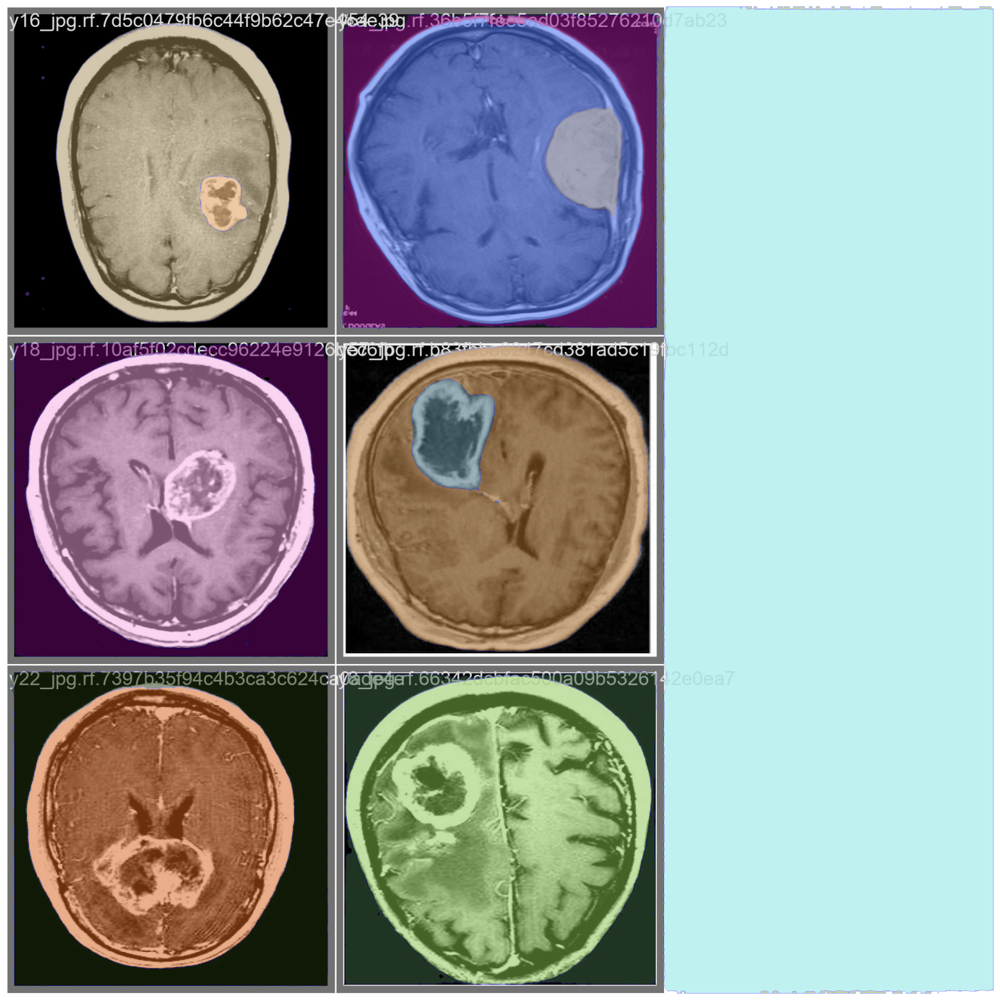

In [ ]:
plt.figure(figsize=(20, 20))
plt.imshow(image)
show_anns(masks)
plt.axis('off')
plt.show()

In [ ]:
mask_generator_2 = SAM2AutomaticMaskGenerator(
    model=sam2,
    points_per_side=64,
    points_per_batch=128,
    pred_iou_thresh=0.7,
    stability_score_thresh=0.92,
    stability_score_offset=0.7,
    crop_n_layers=1,
    box_nms_thresh=0.7,
    crop_n_points_downscale_factor=2,
    min_mask_region_area=25.0,
    use_m2m=True,
)

In [ ]:
masks2 = mask_generator_2.generate(image)

/content/segment-anything-2/sam2/sam2_image_predictor.py:431: UserWarning: cannot import name '_C' from 'sam2' (/content/segment-anything-2/sam2/__init__.py)

Skipping the post-processing step due to the error above. You can still use SAM 2 and it's OK to ignore the error above, although some post-processing functionality may be limited (which doesn't affect the results in most cases; see https://github.com/facebookresearch/segment-anything-2/blob/main/INSTALL.md).
  masks = self._transforms.postprocess_masks(


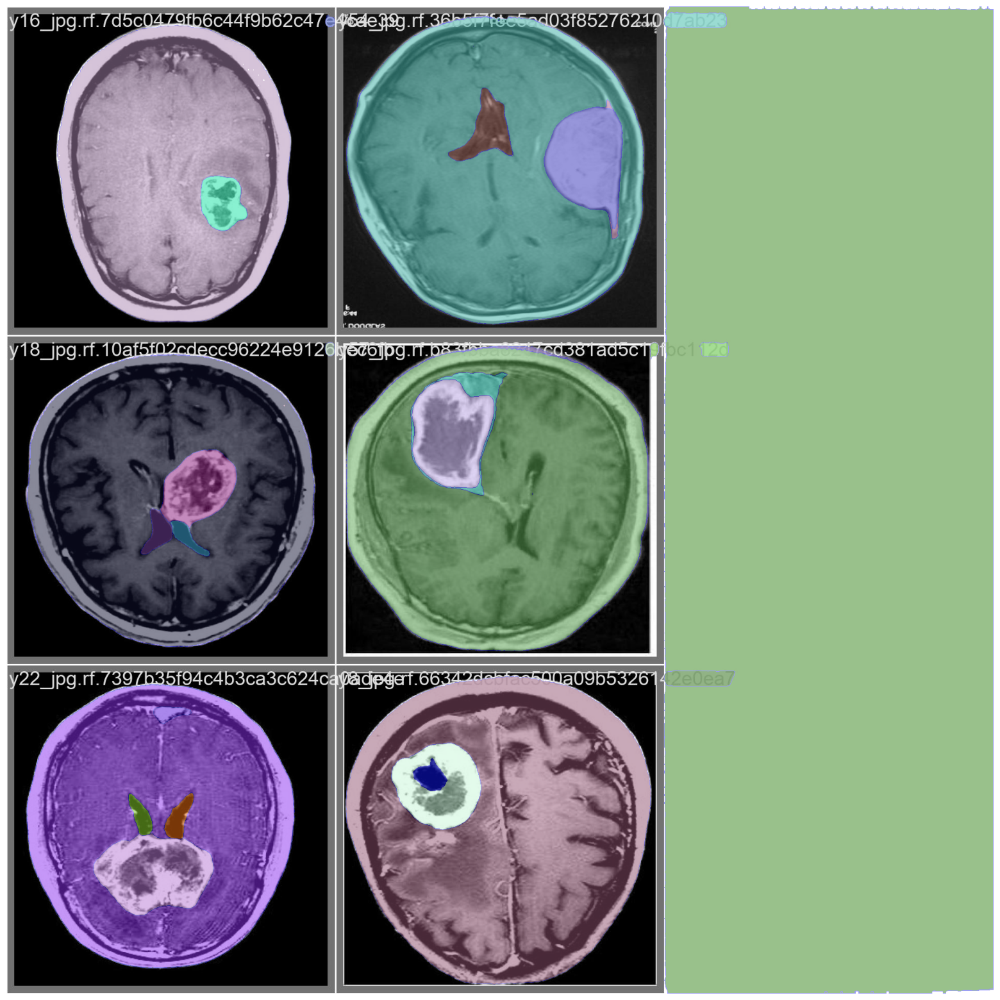

In [ ]:
plt.figure(figsize=(20, 20))
plt.imshow(image)
show_anns(masks2)
plt.axis('off')
plt.show()

In [3]:
# Step 1: Clone the SAM 2 repository
!git clone https://github.com/facebookresearch/segment-anything-2.git

# Step 2: Navigate to the directory and install the package
%cd segment-anything-2
!pip install -e .

# Step 3: Install additional dependencies (Jupyter and Matplotlib)
!pip install -e ".[demo]"

# Step 4: Download model checkpoints
!cd checkpoints && ./download_ckpts.sh && cd ..

# Step 5: (Optional) Check if CUDA is available
import torch
torch.cuda.is_available()

# After completing the steps above, you should be able to use SAM 2 in Google Colab.


Cloning into 'segment-anything-2'...
remote: Enumerating objects: 510, done.
remote: Total 510 (delta 0), reused 0 (delta 0), pack-reused 510 (from 1)
Receiving objects: 100% (510/510), 88.46 MiB | 12.94 MiB/s, done.
Resolving deltas: 100% (157/157), done.
/content/segment-anything-2
Obtaining file:///content/segment-anything-2
  Installing build dependencies ... done
  Checking if build backend supports build_editable ... done
  Getting requirements to build editable ... done
  Preparing editable metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.2/42.2 kB 3.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 117.0/117.0 kB 11.6 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_c

Obtaining file:///content/segment-anything-2
  Installing build dependencies ... done
  Checking if build backend supports build_editable ... done
  Getting requirements to build editable ... done
  Preparing editable metadata (pyproject.toml) ... done
  Using cached jedi-0.19.1-py2.py3-none-any.whl.metadata (22 kB)
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.3/8.3 MB 114.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 123.4/123.4 kB 12.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 93.5/93.5 kB 9.7 MB/s eta 0:00:00
Using cached jedi-0.19.1-py2.py3-none-any.whl (1.6 MB)
  Building editable for SAM-2 (pyproject.toml) ... done
  Created wheel for SAM-2: filename=SAM_2-1.0-0.editable-cp310-cp310-linux_x86_64.whl size=12322 sha256=29d3af335460dcd95f3e212b7105814c3e02d40770dcd4f76d6c88a5785404b9
  Stored in directory: /tmp/pip-ephem-wheel-cache-_2qlqieh/wheels/7d/af/fe/c05425a1fdc391329545b53111d5cabdfc241ee07cab053945
Successfully built SAM-2
  Attempting u

True

In [4]:
from sam2.build_sam import build_sam2_video_predictor

sam2_checkpoint = "/content/segment-anything-2/checkpoints/sam2_hiera_large.pt"
model_cfg = "sam2_hiera_l.yaml"

predictor = build_sam2_video_predictor(model_cfg, sam2_checkpoint, device=device)

In [5]:
def show_mask(mask, ax, obj_id=None, random_color=False):
    if random_color:
        color = np.concatenate([np.random.random(3), np.array([0.6])], axis=0)
    else:
        cmap = plt.get_cmap("tab10")
        cmap_idx = 0 if obj_id is None else obj_id
        color = np.array([*cmap(cmap_idx)[:3], 0.6])
    h, w = mask.shape[-2:]
    mask_image = mask.reshape(h, w, 1) * color.reshape(1, 1, -1)
    ax.imshow(mask_image)


def show_points(coords, labels, ax, marker_size=200):
    pos_points = coords[labels==1]
    neg_points = coords[labels==0]
    ax.scatter(pos_points[:, 0], pos_points[:, 1], color='green', marker='*', s=marker_size, edgecolor='white', linewidth=1.25)
    ax.scatter(neg_points[:, 0], neg_points[:, 1], color='red', marker='*', s=marker_size, edgecolor='white', linewidth=1.25)


def show_box(box, ax):
    x0, y0 = box[0], box[1]
    w, h = box[2] - box[0], box[3] - box[1]
    ax.add_patch(plt.Rectangle((x0, y0), w, h, edgecolor='green', facecolor=(0, 0, 0, 0), lw=2))

In [6]:
!apt-get install ffmpeg


Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
ffmpeg is already the newest version (7:4.4.2-0ubuntu0.22.04.1).
0 upgraded, 0 newly installed, 0 to remove and 45 not upgraded.


In [7]:
!mkdir -p /content/output_frames


In [8]:
!ffmpeg -i "/content/brainscanvideo.mp4" -q:v 2 -start_number 0 "/content/output_frames/%05d.jpg"


ffmpeg version 4.4.2-0ubuntu0.22.04.1 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11 (Ubuntu 11.2.0-19ubuntu1)
  configuration: --prefix=/usr --extra-version=0ubuntu0.22.04.1 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --arch=amd64 --enable-gpl --disable-stripping --enable-gnutls --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libcodec2 --enable-libdav1d --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libgme --enable-libgsm --enable-libjack --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-libpulse --enable-librabbitmq --enable-librubberband --enable-libshine --enable-libsnappy --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libtheora --enable-libtwolame --enable-libvidstab --enable-libvorbis --enable-libvpx --enab

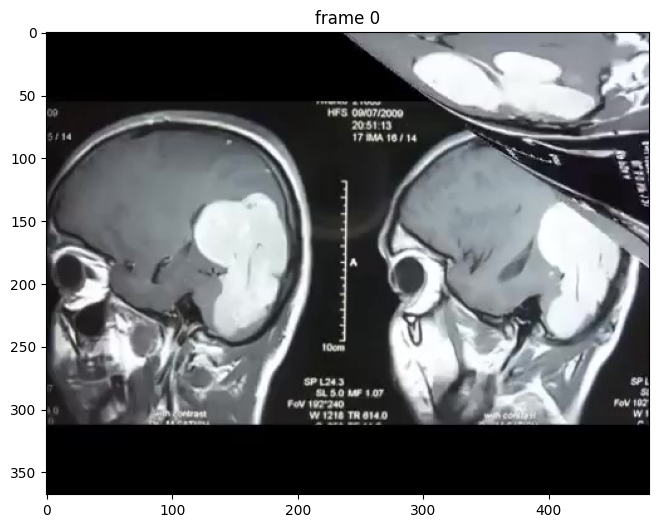

In [9]:
import os
import matplotlib.pyplot as plt
from PIL import Image

# `video_dir` is a directory of JPEG frames with filenames like `<frame_index>.jpg`
video_dir = "/content/output_frames"

# Scan all the JPEG frame names in this directory
frame_names = [
    p for p in os.listdir(video_dir)
    if os.path.splitext(p)[-1] in [".jpg", ".jpeg", ".JPG", ".JPEG"]
]
frame_names.sort(key=lambda p: int(os.path.splitext(p)[0]))

# Take a look at the first video frame
frame_idx = 0
plt.figure(figsize=(9, 6))
plt.title(f"frame {frame_idx}")
plt.imshow(Image.open(os.path.join(video_dir, frame_names[frame_idx])))
plt.show()


In [10]:
inference_state = predictor.init_state(video_path=video_dir)


frame loading (JPEG): 100%|██████████| 75/75 [00:01<00:00, 40.28it/s]


In [ ]:
predictor.reset_state(inference_state)


/content/segment-anything-2/sam2/sam2_video_predictor.py:873: UserWarning: /content/segment-anything-2/sam2/_C.so: undefined symbol: _ZN3c1015SmallVectorBaseIjE8grow_podEPKvmm

Skipping the post-processing step due to the error above. You can still use SAM 2 and it's OK to ignore the error above, although some post-processing functionality may be limited (which doesn't affect the results in most cases; see https://github.com/facebookresearch/segment-anything-2/blob/main/INSTALL.md).
  pred_masks_gpu = fill_holes_in_mask_scores(


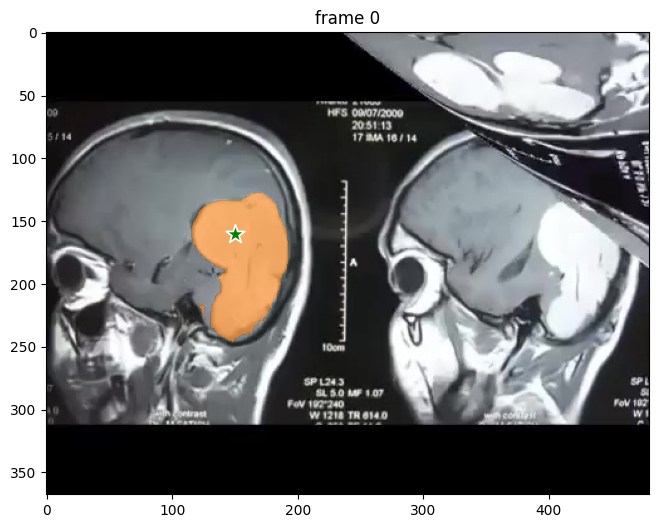

In [11]:
ann_frame_idx = 0  # the frame index we interact with
ann_obj_id = 1  # give a unique id to each object we interact with (it can be any integers)

# Let's add a positive click at (x, y) = (210, 350) to get started
points = np.array([[150, 160]], dtype=np.float32)
# for labels, `1` means positive click and `0` means negative click
labels = np.array([1], np.int32)
_, out_obj_ids, out_mask_logits = predictor.add_new_points_or_box(
    inference_state=inference_state,
    frame_idx=ann_frame_idx,
    obj_id=ann_obj_id,
    points=points,
    labels=labels,
)

# show the results on the current (interacted) frame
plt.figure(figsize=(9, 6))
plt.title(f"frame {ann_frame_idx}")
plt.imshow(Image.open(os.path.join(video_dir, frame_names[ann_frame_idx])))
show_points(points, labels, plt.gca())
show_mask((out_mask_logits[0] > 0.0).cpu().numpy(), plt.gca(), obj_id=out_obj_ids[0])

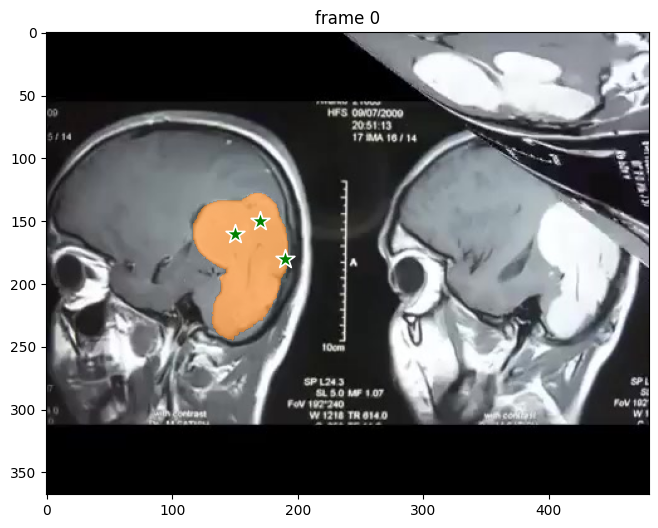

In [12]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import os

ann_frame_idx = 0  # the frame index we interact with
ann_obj_id = 1  # give a unique id to each object we interact with (it can be any integers)

# Updated coordinates to include the verified center of the brain and the additional points
points = np.array([[150, 160], [170, 150], [190, 180]], dtype=np.float32)
labels = np.array([1, 1, 1], np.int32)  # '1' indicates positive click for all points

# Assuming `predictor` and `inference_state` are already defined and initialized
_, out_obj_ids, out_mask_logits = predictor.add_new_points_or_box(
    inference_state=inference_state,
    frame_idx=ann_frame_idx,
    obj_id=ann_obj_id,
    points=points,
    labels=labels,
)

# Visualization adjustments assuming frame_names and video_dir are defined
plt.figure(figsize=(9, 6))
plt.title(f"frame {ann_frame_idx}")
plt.imshow(Image.open(os.path.join(video_dir, frame_names[ann_frame_idx])))
# Assuming show_points and show_mask are defined functions for visualization
show_points(points, labels, plt.gca())
show_mask((out_mask_logits[0] > 0.0).cpu().numpy(), plt.gca(), obj_id=out_obj_ids[0])
plt.show()

propagate in video: 100%|██████████| 75/75 [00:08<00:00,  8.96it/s]


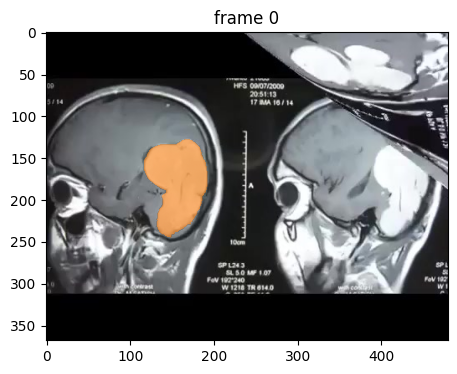

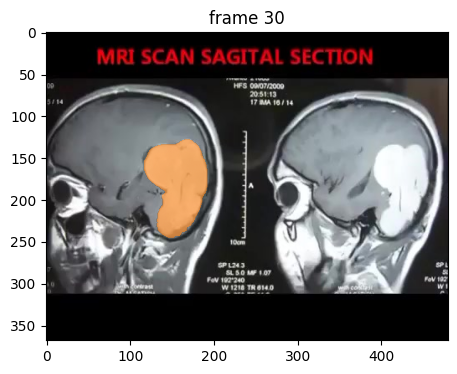

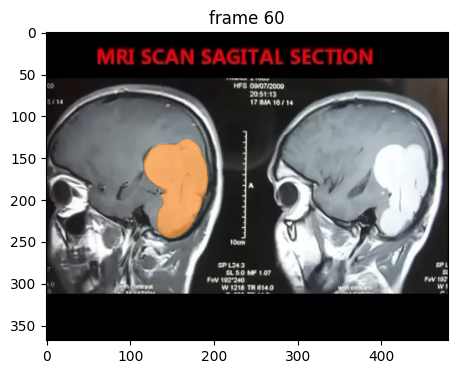

In [13]:
# run propagation throughout the video and collect the results in a dict
video_segments = {}  # video_segments contains the per-frame segmentation results
if inference_state is not None:
    for out_frame_idx, out_obj_ids, out_mask_logits in predictor.propagate_in_video(inference_state):
        video_segments[out_frame_idx] = {
            out_obj_id: (out_mask_logits[i] > 0.0).cpu().numpy()
            for i, out_obj_id in enumerate(out_obj_ids)
        }

        # Check if the inference_state is still not None
        if inference_state is not None:
            inference_state["tracking_has_started"] = True
else:
    print("inference_state is None, unable to run propagate_in_video()")

# render the segmentation results every few frames
vis_frame_stride = 30
plt.close("all")
for out_frame_idx in range(0, len(frame_names), vis_frame_stride):
    plt.figure(figsize=(6, 4))
    plt.title(f"frame {out_frame_idx}")
    plt.imshow(Image.open(os.path.join(video_dir, frame_names[out_frame_idx])))
    if out_frame_idx in video_segments:
        for out_obj_id, out_mask in video_segments[out_frame_idx].items():
            show_mask(out_mask, plt.gca(), obj_id=out_obj_id)

propagate in video: 100%|██████████| 75/75 [00:08<00:00,  8.95it/s]


Video saved at segmented_output.mp4


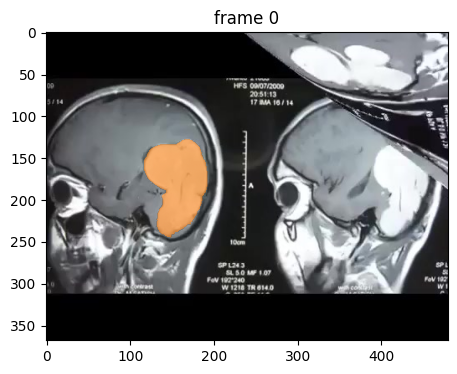

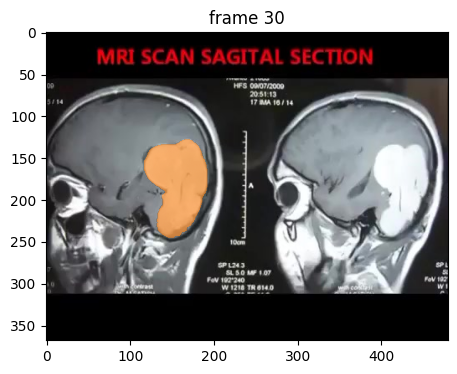

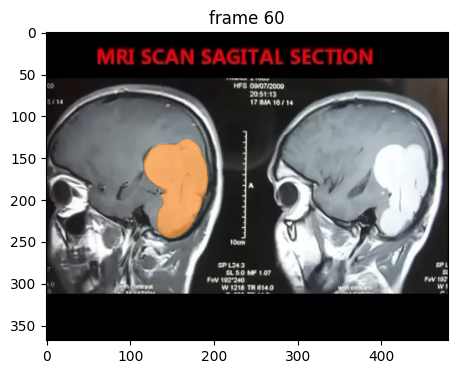

In [14]:
import cv2
import os
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt

def save_video(output_path, video_segments, frame_names, video_dir, vis_frame_stride=30):
    # Get the size of the frames from the first image
    sample_frame = Image.open(os.path.join(video_dir, frame_names[0]))
    frame_width, frame_height = sample_frame.size

    # Initialize the video writer
    fourcc = cv2.VideoWriter_fourcc(*'mp4v')  # Codec for .mp4
    fps = 10  # Adjust the frames per second as needed
    video_writer = cv2.VideoWriter(output_path, fourcc, fps, (frame_width, frame_height))

    # Iterate over frames and save them
    for out_frame_idx in range(0, len(frame_names), vis_frame_stride):
        # Open the original frame
        frame = Image.open(os.path.join(video_dir, frame_names[out_frame_idx]))
        frame = np.array(frame)

        # Convert to BGR for OpenCV (PIL uses RGB format)
        frame = cv2.cvtColor(frame, cv2.COLOR_RGB2BGR)

        if out_frame_idx in video_segments:
            for out_obj_id, out_mask in video_segments[out_frame_idx].items():
                # Ensure that the mask matches the frame dimensions
                if out_mask.shape != (frame_height, frame_width):
                    out_mask = np.reshape(out_mask, (frame_height, frame_width))

                # Overlay the mask onto the frame
                colored_mask = np.zeros_like(frame)
                colored_mask[out_mask] = [0, 255, 0]  # Green mask (adjust color if needed)
                alpha = 0.5  # Transparency for overlay
                frame = cv2.addWeighted(colored_mask, alpha, frame, 1 - alpha, 0)

        # Write the frame to the video
        video_writer.write(frame)

    # Release the video writer
    video_writer.release()
    print(f"Video saved at {output_path}")

# Run propagation throughout the video and collect the results in a dict
video_segments = {}  # video_segments contains the per-frame segmentation results
if inference_state is not None:
    for out_frame_idx, out_obj_ids, out_mask_logits in predictor.propagate_in_video(inference_state):
        video_segments[out_frame_idx] = {
            out_obj_id: (out_mask_logits[i] > 0.0).cpu().numpy()
            for i, out_obj_id in enumerate(out_obj_ids)
        }

        # Check if the inference_state is still not None
        if inference_state is not None:
            inference_state["tracking_has_started"] = True
else:
    print("inference_state is None, unable to run propagate_in_video()")

# Save the segmentation results as a video
output_video_path = "segmented_output.mp4"
save_video(output_video_path, video_segments, frame_names, video_dir)

# Optionally, render the segmentation results every few frames for visualization
vis_frame_stride = 30
plt.close("all")
for out_frame_idx in range(0, len(frame_names), vis_frame_stride):
    plt.figure(figsize=(6, 4))
    plt.title(f"frame {out_frame_idx}")
    plt.imshow(Image.open(os.path.join(video_dir, frame_names[out_frame_idx])))
    if out_frame_idx in video_segments:
        for out_obj_id, out_mask in video_segments[out_frame_idx].items():
            show_mask(out_mask, plt.gca(), obj_id=out_obj_id)


In [15]:
import cv2
import os
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt

def save_video(output_path, video_segments, frame_names, video_dir, vis_frame_stride=30):
    # Get the size of the frames from the first image
    sample_frame = Image.open(os.path.join(video_dir, frame_names[0]))
    frame_width, frame_height = sample_frame.size

    # Initialize the video writer
    fourcc = cv2.VideoWriter_fourcc(*'mp4v')  # Codec for .mp4
    fps = 10  # Adjust the frames per second as needed
    video_writer = cv2.VideoWriter(output_path, fourcc, fps, (frame_width, frame_height))

    # Iterate over frames and save them
    for out_frame_idx in range(0, len(frame_names), vis_frame_stride):
        # Open the original frame
        frame = Image.open(os.path.join(video_dir, frame_names[out_frame_idx]))
        frame = np.array(frame)

        # Convert to BGR for OpenCV (PIL uses RGB format)
        frame = cv2.cvtColor(frame, cv2.COLOR_RGB2BGR)

        if out_frame_idx in video_segments:
            for out_obj_id, out_mask in video_segments[out_frame_idx].items():
                # Overlay the mask onto the frame
                colored_mask = np.zeros_like(frame)
                colored_mask[out_mask] = [0, 255, 0]  # Green mask (adjust color if needed)
                alpha = 0.5  # Transparency for overlay
                frame = cv2.addWeighted(colored_mask, alpha, frame, 1 - alpha, 0)

        # Write the frame to the video
        video_writer.write(frame)

    # Release the video writer
    video_writer.release()
    print(f"Video saved at {output_path}")

# Add initial points or masks to the inference state
initial_points = [[306, 250], [330, 240]]  # Coordinates you provided
initial_labels = [1, 1]  # Assuming 1 means foreground

# Initialize inference state with the initial points
if inference_state is not None:
    predictor.add_points(inference_state, initial_points, initial_labels)
else:
    print("inference_state is None, unable to add points.")

# Run propagation throughout the video and collect the results in a dict
video_segments = {}  # video_segments contains the per-frame segmentation results
if inference_state is not None:
    for out_frame_idx, out_obj_ids, out_mask_logits in predictor.propagate_in_video(inference_state):
        video_segments[out_frame_idx] = {
            out_obj_id: (out_mask_logits[i] > 0.0).cpu().numpy()
            for i, out_obj_id in enumerate(out_obj_ids)
        }

        # Check if the inference_state is still not None
        if inference_state is not None:
            inference_state["tracking_has_started"] = True
else:
    print("inference_state is None, unable to run propagate_in_video()")

# Save the segmentation results as a video
output_video_path = "segmented_output.mp4"
save_video(output_video_path, video_segments, frame_names, video_dir)

# Optionally, render the segmentation results every few frames for visualization
vis_frame_stride = 30
plt.close("all")
for out_frame_idx in range(0, len(frame_names), vis_frame_stride):
    plt.figure(figsize=(6, 4))
    plt.title(f"frame {out_frame_idx}")
    plt.imshow(Image.open(os.path.join(video_dir, frame_names[out_frame_idx])))
    if out_frame_idx in video_segments:
        for out_obj_id, out_mask in video_segments[out_frame_idx].items():
            show_mask(out_mask, plt.gca(), obj_id=out_obj_id)


AttributeError: 'SAM2VideoPredictor' object has no attribute 'add_points'

In [ ]:
!pip install opencv-python


In [ ]:
import cv2
import os
from PIL import Image

def save_video(output_path, video_segments, frame_names, video_dir, vis_frame_stride=30):
    # Get the size of the frames from the first image
    sample_frame = Image.open(os.path.join(video_dir, frame_names[0]))
    frame_width, frame_height = sample_frame.size

    # Initialize the video writer
    fourcc = cv2.VideoWriter_fourcc(*'mp4v')  # Codec for .mp4
    fps = 10  # Adjust the frames per second as needed
    video_writer = cv2.VideoWriter(output_path, fourcc, fps, (frame_width, frame_height))

    # Iterate over frames and save them
    for out_frame_idx in range(0, len(frame_names), vis_frame_stride):
        # Open the original frame
        frame = Image.open(os.path.join(video_dir, frame_names[out_frame_idx]))
        frame = np.array(frame)

        # Convert to BGR for OpenCV (PIL uses RGB format)
        frame = cv2.cvtColor(frame, cv2.COLOR_RGB2BGR)

        if out_frame_idx in video_segments:
            for out_obj_id, out_mask in video_segments[out_frame_idx].items():
                # Overlay the mask onto the frame
                colored_mask = np.zeros_like(frame)
                colored_mask[out_mask] = [0, 255, 0]  # Green mask (adjust color if needed)
                alpha = 0.5  # Transparency for overlay
                frame = cv2.addWeighted(colored_mask, alpha, frame, 1 - alpha, 0)

        # Write the frame to the video
        video_writer.write(frame)

    # Release the video writer
    video_writer.release()
    print(f"Video saved at {output_path}")

# Run propagation throughout the video and collect the results in a dict
video_segments = {}  # video_segments contains the per-frame segmentation results
if inference_state is not None:
    for out_frame_idx, out_obj_ids, out_mask_logits in predictor.propagate_in_video(inference_state):
        video_segments[out_frame_idx] = {
            out_obj_id: (out_mask_logits[i] > 0.0).cpu().numpy()
            for i, out_obj_id in enumerate(out_obj_ids)
        }

        # Check if the inference_state is still not None
        if inference_state is not None:
            inference_state["tracking_has_started"] = True
else:
    print("inference_state is None, unable to run propagate_in_video()")

# Save the video
output_video_path = "segmented_output.mp4"
save_video(output_video_path, video_segments, frame_names, video_dir)


inference_state is None, unable to run propagate_in_video()
Video saved at segmented_output.mp4


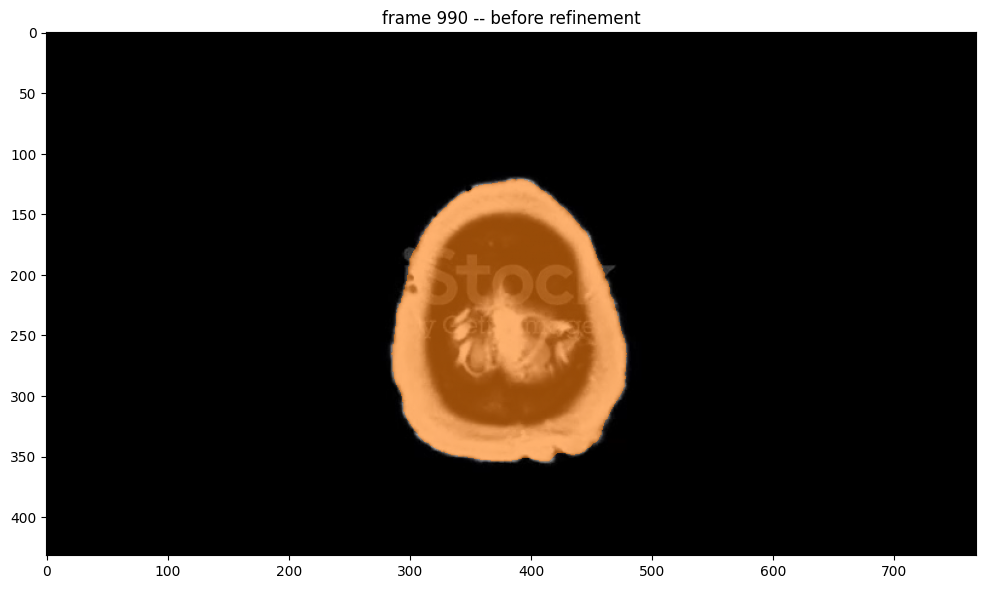

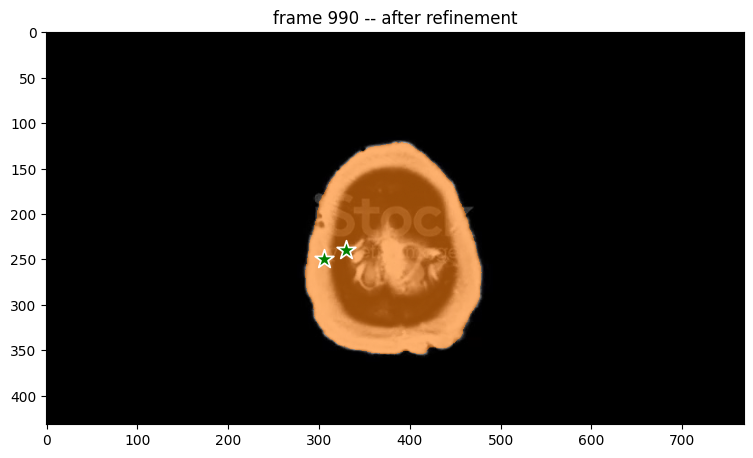

In [ ]:
ann_frame_idx = 990  # further refine some details on this frame
ann_obj_id = 1  # give a unique id to the object we interact with (it can be any integers)

# show the segment before further refinement
plt.figure(figsize=(12, 8))
plt.title(f"frame {ann_frame_idx} -- before refinement")
plt.imshow(Image.open(os.path.join(video_dir, frame_names[ann_frame_idx])))
if ann_frame_idx in video_segments and ann_obj_id in video_segments[ann_frame_idx]:
    show_mask(video_segments[ann_frame_idx][ann_obj_id], plt.gca(), obj_id=ann_obj_id)
else:
    print(f"No segmentation data found for frame {ann_frame_idx}")

# Let's add three positive clicks on this frame at the given coordinates
points = np.array([[330, 240], [306, 250], [528, 783]], dtype=np.float32)
labels = np.array([1, 1, 1], np.int32)  # '1' indicates positive click for all points
_, _, out_mask_logits = predictor.add_new_points_or_box(
    inference_state=inference_state,
    frame_idx=ann_frame_idx,
    obj_id=ann_obj_id,
    points=points,
    labels=labels,
)

# show the segment after the further refinement
plt.figure(figsize=(9, 6))
plt.title(f"frame {ann_frame_idx} -- after refinement")
plt.imshow(Image.open(os.path.join(video_dir, frame_names[ann_frame_idx])))
show_points(points, labels, plt.gca())
show_mask((out_mask_logits > 0.0).cpu().numpy(), plt.gca(), obj_id=ann_obj_id)

inference_state is None, unable to run propagate_in_video()


<ipython-input-18-5a8900878c7e>:20: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(6, 4))


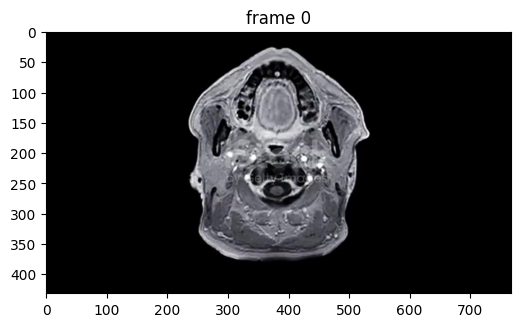

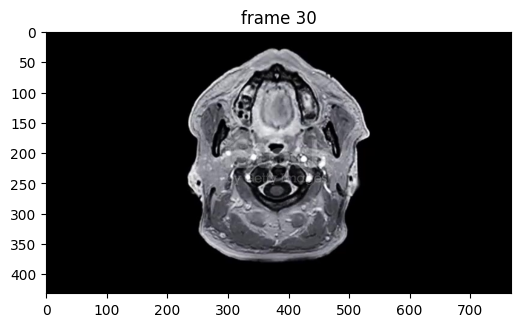

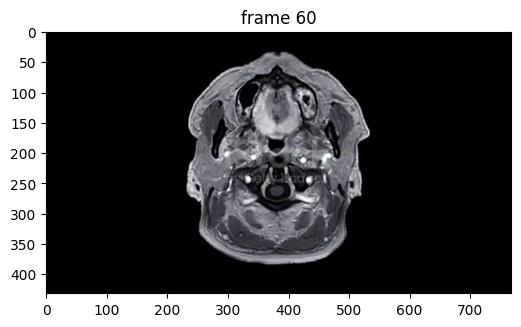

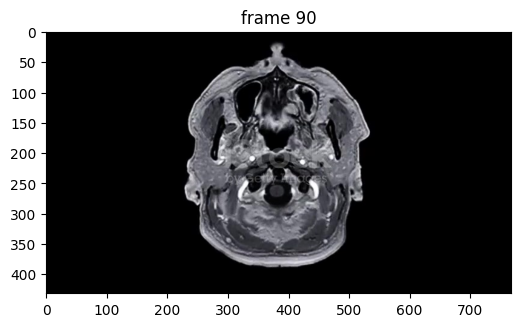

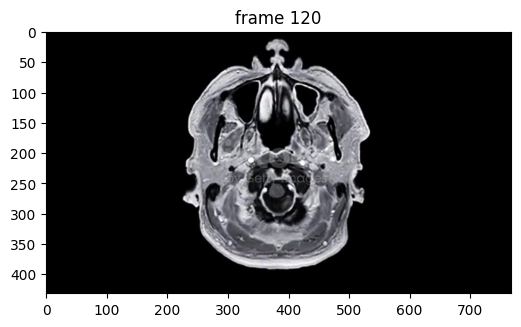

...

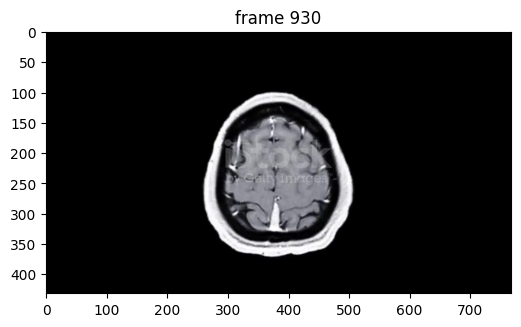

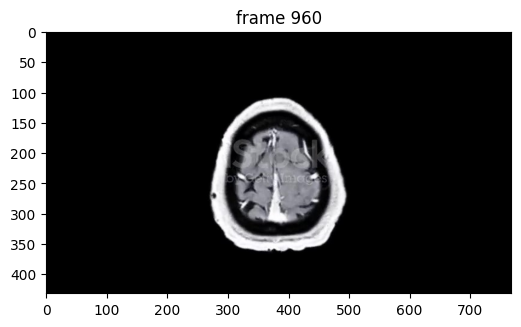

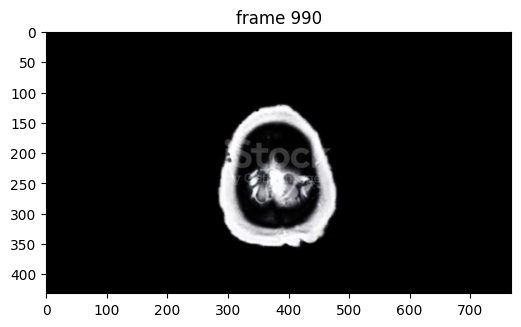

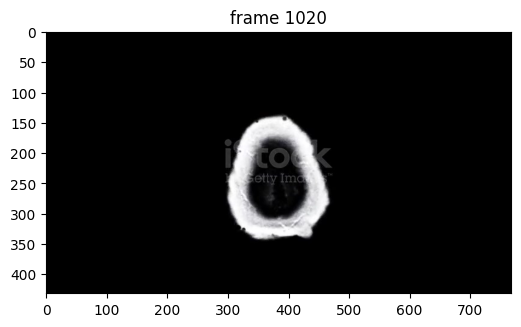

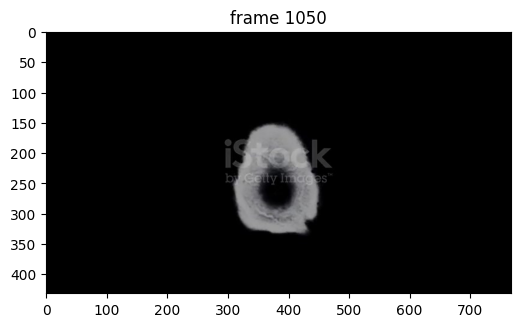

In [ ]:
# run propagation throughout the video and collect the results in a dict
video_segments = {}  # video_segments contains the per-frame segmentation results
if inference_state is not None:
    for out_frame_idx, out_obj_ids, out_mask_logits in predictor.propagate_in_video(inference_state):
        video_segments[out_frame_idx] = {
            out_obj_id: (out_mask_logits[i] > 0.0).cpu().numpy()
            for i, out_obj_id in enumerate(out_obj_ids)
        }

        # Check if the inference_state is still not None
        if inference_state is not None:
            inference_state["tracking_has_started"] = True
else:
    print("inference_state is None, unable to run propagate_in_video()")

# render the segmentation results every few frames
vis_frame_stride = 30
plt.close("all")
for out_frame_idx in range(0, len(frame_names), vis_frame_stride):
    plt.figure(figsize=(6, 4))
    plt.title(f"frame {out_frame_idx}")
    plt.imshow(Image.open(os.path.join(video_dir, frame_names[out_frame_idx])))
    if out_frame_idx in video_segments:
        for out_obj_id, out_mask in video_segments[out_frame_idx].items():
            show_mask(out_mask, plt.gca(), obj_id=out_obj_id)

In [ ]:
ann_frame_idx = 0  # the frame index we interact with
ann_obj_id = 4  # give a unique id to each object we interact with (it can be any integers)

# Let's add a box at (x_min, y_min, x_max, y_max) = (300, 0, 500, 400) to get started
box = np.array([306, 250, 330, 240], dtype=np.float32)

if inference_state is not None and "obj_id_to_idx" in inference_state:
    _, out_obj_ids, out_mask_logits = predictor.add_new_points_or_box(
        inference_state=inference_state,
        frame_idx=ann_frame_idx,
        obj_id=ann_obj_id,
        box=box,
    )

    # show the results on the current (interacted) frame
    plt.figure(figsize=(9, 6))
    plt.title(f"frame {ann_frame_idx}")
    plt.imshow(Image.open(os.path.join(video_dir, frame_names[ann_frame_idx])))
    show_box(box, plt.gca())
    show_mask((out_mask_logits[0] > 0.0).cpu().numpy(), plt.gca(), obj_id=out_obj_ids[0])
else:
    print("Unable to add new points or box due to missing 'obj_id_to_idx' in inference_state")

Unable to add new points or box due to missing 'obj_id_to_idx' in inference_state


In [ ]:
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt

# Assuming you have the necessary setup (video_dir, frame_names, predictor, inference_state, show_points, show_box, show_mask)

# Reset the state before starting the new example
if inference_state is not None:
    predictor.reset_state(inference_state)
else:
    print("Unable to reset state, inference_state is None.")
    return

# Example 3: Segment multiple objects simultaneously

# Step 1: Add two objects on a frame
prompts = {}  # hold all the clicks we add for visualization

# Add the first object (the left child's shirt) with a positive click at (x, y) = (200, 300) on frame 0
ann_frame_idx = 0
ann_obj_id = 2
points = np.array([[200, 300]], dtype=np.float32)
labels = np.array([1], np.int32)
prompts[ann_obj_id] = points, labels
_, out_obj_ids, out_mask_logits = predictor.add_new_points_or_box(
    inference_state=inference_state,
    frame_idx=ann_frame_idx,
    obj_id=ann_obj_id,
    points=points,
    labels=labels,
)

# Show the results on the current (interacted) frame
plt.figure(figsize=(9, 6))
plt.title(f"frame {ann_frame_idx}")
plt.imshow(Image.open(os.path.join(video_dir, frame_names[ann_frame_idx])))
show_points(points, labels, plt.gca())
for i, out_obj_id in enumerate(out_obj_ids):
    show_points(*prompts[out_obj_id], plt.gca())
    show_mask((out_mask_logits[i] > 0.0).cpu().numpy(), plt.gca(), obj_id=out_obj_id)

# Rest of the code remains the same

SyntaxError: 'return' outside function (<ipython-input-26-852baded41e0>, line 12)

In [ ]:
import gc
import jax

# Run garbage collection
gc.collect()

# Clear JAX GPU/TPU memory
jax.clear_backends()


<ipython-input-18-8bc0cb793e2d>:8: DeprecationWarning: jax.clear_backends is deprecated.
  jax.clear_backends()


In [ ]:
!nvidia-smi


Thu Aug 22 20:34:47 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla T4                       Off | 00000000:00:04.0 Off |                    0 |
| N/A   61C    P0              29W /  70W |  14861MiB / 15360MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

frame loading (JPEG): 100%|██████████| 1068/1068 [00:27<00:00, 39.14it/s]


OutOfMemoryError: CUDA out of memory. Tried to allocate 12.52 GiB. GPU 

In [ ]:
ann_frame_idx = 0  # the frame index we interact with
ann_obj_id = 4  # give a unique id to each object we interact with (it can be any integers)

# Let's add a positive click at (x, y) = (460, 60) to refine the mask
points = np.array([[460, 60]], dtype=np.float32)
# for labels, `1` means positive click and `0` means negative click
labels = np.array([1], np.int32)
# note that we also need to send the original box input along with
# the new refinement click together into `add_new_points_or_box`
box = np.array([300, 0, 500, 400], dtype=np.float32)
_, out_obj_ids, out_mask_logits = predictor.add_new_points_or_box(
    inference_state=inference_state,
    frame_idx=ann_frame_idx,
    obj_id=ann_obj_id,
    points=points,
    labels=labels,
    box=box,
)

# show the results on the current (interacted) frame
plt.figure(figsize=(9, 6))
plt.title(f"frame {ann_frame_idx}")
plt.imshow(Image.open(os.path.join(video_dir, frame_names[ann_frame_idx])))
show_box(box, plt.gca())
show_points(points, labels, plt.gca())
show_mask((out_mask_logits[0] > 0.0).cpu().numpy(), plt.gca(), obj_id=out_obj_ids[0])

TypeError: 'ellipsis' object is not subscriptable

In [ ]:
import torch
import gc

# Clean up unused variables to free memory
def clear_memory():
    torch.cuda.empty_cache()
    gc.collect()

# Call clear_memory() periodically, especially inside loops


In [ ]:
import numpy as np
import torch
import matplotlib.pyplot as plt
from PIL import Image

# Set CUDA environment and configurations
torch.autocast(device_type="cuda", dtype=torch.bfloat16).__enter__()

if torch.cuda.get_device_properties(0).major >= 8:
    torch.backends.cuda.matmul.allow_tf32 = True
    torch.backends.cudnn.allow_tf32 = True

def show_anns(anns, borders=True):
    if len(anns) == 0:
        return
    sorted_anns = sorted(anns, key=(lambda x: x['area']), reverse=True)
    ax = plt.gca()
    ax.set_autoscale_on(False)

    img = np.ones((sorted_anns[0]['segmentation'].shape[0], sorted_anns[0]['segmentation'].shape[1], 4))
    img[:,:,3] = 0
    for ann in sorted_anns:
        m = ann['segmentation']
        color_mask = np.concatenate([np.random.random(3), [0.5]])
        img[m] = color_mask
        if borders:
            import cv2
            contours, _ = cv2.findContours(m.astype(np.uint8), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)
            contours = [cv2.approxPolyDP(contour, epsilon=0.01, closed=True) for contour in contours]
            cv2.drawContours(img, contours, -1, (0,0,1,0.4), thickness=1)

    ax.imshow(img)

# Load your image
image = Image.open('/content/Y10.jpg')
image = np.array(image.convert("RGB"))

# Load the SAM 2 model and initialize the mask generator
from sam2.build_sam import build_sam2
from sam2.sam2_image_predictor import SAM2ImagePredictor

sam2_checkpoint = "./checkpoints/sam2_hiera_large.pt"
model_cfg = "sam2_hiera_l.yaml"

predictor = SAM2ImagePredictor(build_sam2(model_cfg, sam2_checkpoint))

with torch.inference_mode(), torch.autocast("cuda", dtype=torch.bfloat16):
    predictor.set_image(image)

    # Using the estimated coordinates for the tumor center (x=220, y=80)
    point_prompt = {"points": np.array([[220, 80, 1]])}  # 1 indicates it's a positive point for segmentation

    # Generate the prediction using point prompts
    masks, _, _ = predictor.predict(point_prompt)

# Display the predictions
plt.figure(figsize=(20, 20))
plt.imshow(image)
show_anns(masks)
plt.axis('off')
plt.show()


AssertionError: point_labels must be supplied if point_coords is supplied.

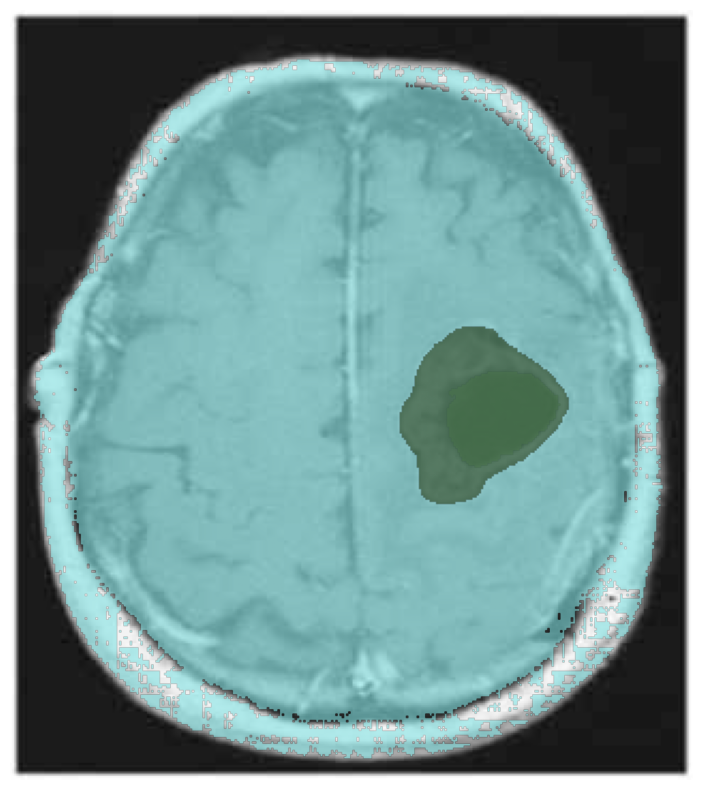

In [ ]:
import numpy as np
import torch
import matplotlib.pyplot as plt
from PIL import Image

# ... (previous imports and CUDA setup)

def show_mask(mask, ax, random_color=False):
    if random_color:
        color = np.concatenate([np.random.random(3), np.array([0.6])], axis=0)
    else:
        color = np.array([30/255, 144/255, 255/255, 0.6])
    h, w = mask.shape[-2:]
    mask_image = mask.reshape(h, w, 1) * color.reshape(1, 1, -1)
    ax.imshow(mask_image)

# Load your image
image = Image.open('/content/Y10.jpg')
image = np.array(image.convert("RGB"))

# Load the SAM 2 model and initialize the mask generator
from sam2.build_sam import build_sam2
from sam2.sam2_image_predictor import SAM2ImagePredictor

sam2_checkpoint = "./checkpoints/sam2_hiera_large.pt"
model_cfg = "sam2_hiera_l.yaml"

predictor = SAM2ImagePredictor(build_sam2(model_cfg, sam2_checkpoint))

with torch.inference_mode(), torch.autocast("cuda", dtype=torch.bfloat16):
    predictor.set_image(image)

    # Using the estimated coordinates for the tumor center (x=220, y=180)
    point_coords = np.array([[220, 180]])
    point_labels = np.array([1])  # 1 indicates it's a positive point for segmentation

    # Generate the prediction using point prompts
    masks, _, _ = predictor.predict(
        point_coords=point_coords,
        point_labels=point_labels
    )

# Display the predictions
plt.figure(figsize=(10, 10))
plt.imshow(image)
for mask in masks:
    show_mask(mask, plt.gca(), random_color=True)
plt.axis('off')
plt.show()

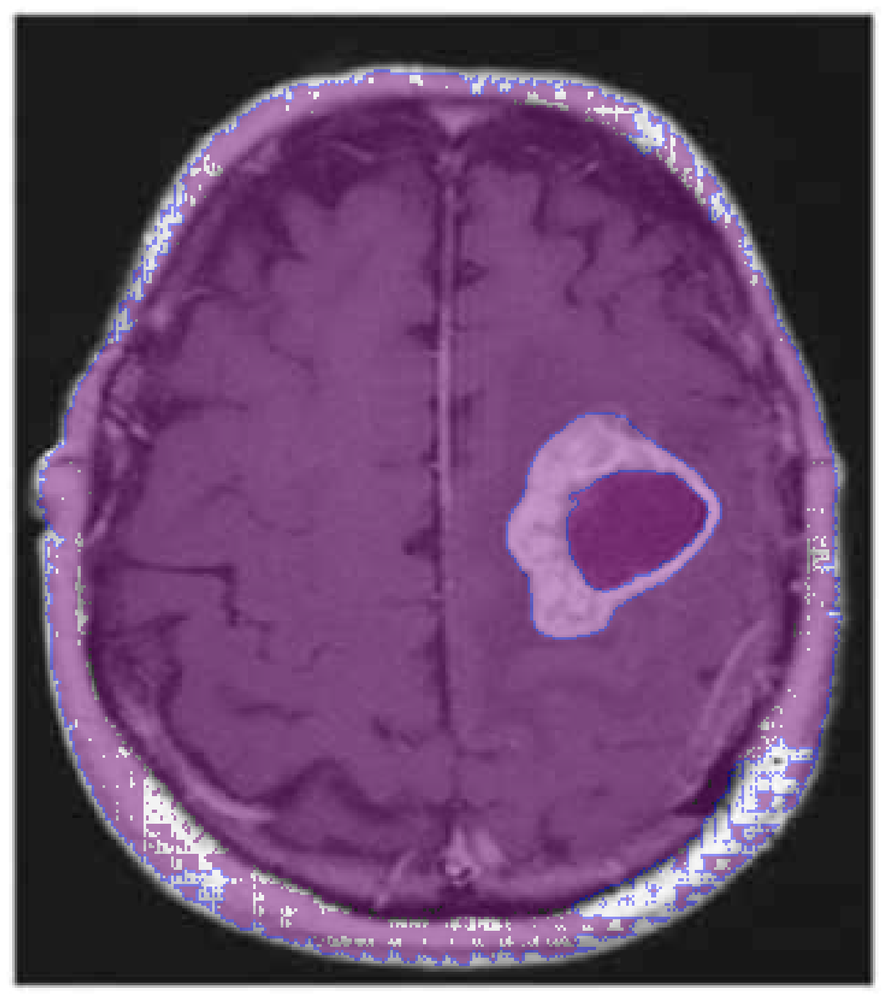

In [ ]:
import numpy as np
import torch
import matplotlib.pyplot as plt
from PIL import Image

# Set CUDA environment and configurations
torch.autocast(device_type="cuda", dtype=torch.bfloat16).__enter__()

if torch.cuda.get_device_properties(0).major >= 8:
    torch.backends.cuda.matmul.allow_tf32 = True
    torch.backends.cudnn.allow_tf32 = True

def show_anns(anns, image, borders=True):
    if len(anns) == 0:
        return
    sorted_anns = sorted(anns, key=(lambda x: x.sum()), reverse=True)
    ax = plt.gca()
    ax.set_autoscale_on(False)

    img = np.ones((image.shape[0], image.shape[1], 4))
    img[:,:,3] = 0
    for ann in sorted_anns:
        m = ann.astype(np.uint8)
        color_mask = np.concatenate([np.random.random(3), [0.5]])
        img[m > 0] = color_mask
        if borders:
            import cv2
            contours, _ = cv2.findContours(m, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)
            contours = [cv2.approxPolyDP(contour, epsilon=0.01, closed=True) for contour in contours]
            cv2.drawContours(img, contours, -1, (0,0,1,0.4), thickness=1)

    ax.imshow(img)

# Load your image
image = Image.open('/content/Y10.jpg')
image = np.array(image.convert("RGB"))

# Load the SAM 2 model and initialize the mask generator
from sam2.build_sam import build_sam2
from sam2.sam2_image_predictor import SAM2ImagePredictor

sam2_checkpoint = "./checkpoints/sam2_hiera_large.pt"
model_cfg = "sam2_hiera_l.yaml"

predictor = SAM2ImagePredictor(build_sam2(model_cfg, sam2_checkpoint))

with torch.inference_mode(), torch.autocast("cuda", dtype=torch.bfloat16):
    predictor.set_image(image)

    # Using the estimated coordinates for the tumor center (x=220, y=180)
    point_coords = np.array([[220, 180]])
    point_labels = np.array([1])  # 1 indicates it's a positive point for segmentation

    # Generate the prediction using point prompts
    masks, _, _ = predictor.predict(
        point_coords=point_coords,
        point_labels=point_labels
    )

# Display the predictions
plt.figure(figsize=(20, 20))
plt.imshow(image)
show_anns(masks, image)
plt.axis('off')
plt.show()

In [ ]:
import numpy as np
import torch
import matplotlib.pyplot as plt
from PIL import Image

# Set CUDA environment and configurations
torch.autocast(device_type="cuda", dtype=torch.bfloat16).__enter__()

if torch.cuda.get_device_properties(0).major >= 8:
    torch.backends.cuda.matmul.allow_tf32 = True
    torch.backends.cudnn.allow_tf32 = True

def show_anns(anns, borders=True):
    if len(anns) == 0:
        return
    # Instead of sorting, directly iterate through the masks
    ax = plt.gca()
    ax.set_autoscale_on(False)

    # Assuming masks are binary (0 or 1), adjust as needed
    img = np.ones((anns[0].shape[0], anns[0].shape[1], 4))
    img[:,:,3] = 0
    for ann in anns:
        m = ann
        color_mask = np.concatenate([np.random.random(3), [0.5]])
        img[m] = color_mask
        if borders:
            import cv2
            contours, _ = cv2.findContours(m.astype(np.uint8), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)
            contours = [cv2.approxPolyDP(contour, epsilon=0.01, closed=True) for contour in contours]
            cv2.drawContours(img, contours, -1, (0,0,1

SyntaxError: incomplete input (<ipython-input-23-6b90dda71f4c>, line 31)

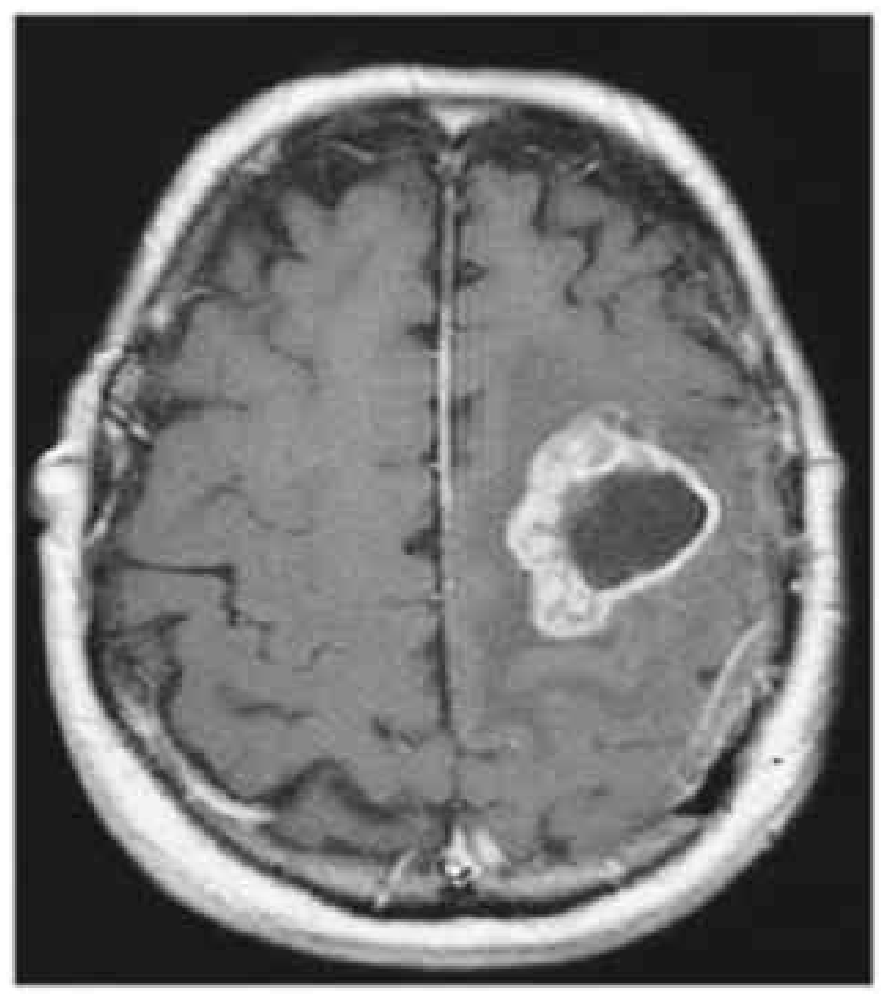

NotImplementedError: Image format not supported

In [ ]:
import os
import numpy as np
import torch
import matplotlib.pyplot as plt
from PIL import Image
from sam2.build_sam import build_sam2
from sam2.sam2_image_predictor import SAM2ImagePredictor


# Define the paths for the checkpoint and model configuration
checkpoint = "/content/segment-anything-2/checkpoints/sam2_hiera_large.pt"
model_cfg = "sam2_hiera_l.yaml"

# Initialize the model and predictor
model = build_sam2(model_cfg, checkpoint)
predictor = SAM2ImagePredictor(model)

# Load and display the image
image_path = "/content/Y10.jpg"
image = Image.open(image_path).convert("RGB")
image_np = np.array(image)

# Display the image
plt.figure(figsize=(20, 20))
plt.imshow(image_np)
plt.axis('off')
plt.show()

# Run inference with the predictor
with torch.inference_mode(), torch.autocast("cuda", dtype=torch.bfloat16):
    predictor.set_image(image_path)
    masks, _, _ = predictor.predict("detect the tumor")

# Output the masks (for demonstration purposes)
print("Masks:", masks)


In [ ]:
! pip install torch

In [ ]:
! pip install torchvision

  Using cached torchvision-0.19.0-cp310-cp310-manylinux1_x86_64.whl.metadata (6.0 kB)
  Using cached torch-2.4.0-cp310-cp310-manylinux1_x86_64.whl.metadata (26 kB)
Using cached torchvision-0.19.0-cp310-cp310-manylinux1_x86_64.whl (7.0 MB)
Using cached torch-2.4.0-cp310-cp310-manylinux1_x86_64.whl (797.2 MB)
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
torchaudio 2.3.0+cpu requires torch==2.3.0, but you have torch 2.4.0 which is incompatible.


In [ ]:
! pip uninstall torch

In [ ]:
import torch
from sam2.build_sam import build_sam2_video_predictor

# Define the paths for the checkpoint and model configuration
checkpoint = "/content/segment-anything-2/checkpoints/sam2_hiera_large.pt"
model_cfg = "sam2_hiera_l.yaml"

# Build the SAM2 video predictor
predictor = build_sam2_video_predictor(model_cfg, checkpoint)

# Path to your video file
video_path = "/content/football_result (1).mp4"

# Run inference
with torch.inference_mode(), torch.autocast("cuda", dtype=torch.bfloat16):
    # Initialize the predictor state with the video
    state = predictor.init_state(video_path)

    # Define prompts for the model (example prompts)
    # Replace with actual prompts based on your needs
    prompts = {
        'points': [[100, 150]],  # Example: list of coordinates (x, y)
        'boxes': [[50, 100, 200, 250]],  # Example: list of bounding boxes (x1, y1, x2, y2)
        'labels': [1]  # Example: labels for the prompts (1 for foreground, 0 for background)
    }

    # Add new points or boxes to the model
    frame_idx, object_ids, masks = predictor.add_new_points_or_box(state, prompts)

    # Propagate the prompts to get masklets throughout the video
    for frame_idx, object_ids, masks in predictor.propagate_in_video(state):
        # Process the output masks (e.g., save, display, or analyze)
        print(f"Frame {frame_idx}: Detected object IDs: {object_ids}, Masks: {masks}")

        # Additional code to handle masks
        # Example: Save masks as images, display, or analyze
        # You may need to convert masks to a visualizable format


NotImplementedError: Only JPEG frames are supported at this moment. For video files, you may use ffmpeg (https://ffmpeg.org/) to extract frames into a folder of JPEG files, such as 
```
ffmpeg -i <your_video>.mp4 -q:v 2 -start_number 0 <output_dir>/'%05d.jpg'
```
where `-q:v` generates high-quality JPEG frames and `-start_number 0` asks ffmpeg to start the JPEG file from 00000.jpg.